$\textbf{PrivPGD: Generating Private Datasets with Particle Gradient Descent and Optimal Transport}$

This notebook offers a comprehensive walkthrough of the PrivPGD method for differentially private data synthesis of sensitive tabular datasets. PrivPGD is a generation method for marginal-based data synthesis. It processes noisy marginals as inputs to construct a private dataset.

This tutorial covers marginal selection, marginal privatization and dataset generation. The first two are standard in marginal-based data synthetis, for further technical details and theoretical insights, please refer to Section 2.2 and Algorithm 1 in the paper. Following the privatization of marginals, PrivPGD is employed for the generation of the private dataset.

$\textbf{Creating a synthetic dataset.  }$ We create a synthetic dataset with two features, X1 and X2, discretized into 16 and 32 bins respectively. We now demonstrate how PrivPGD can be applied to a simple dataset, providing a clear illustration of its functionality.

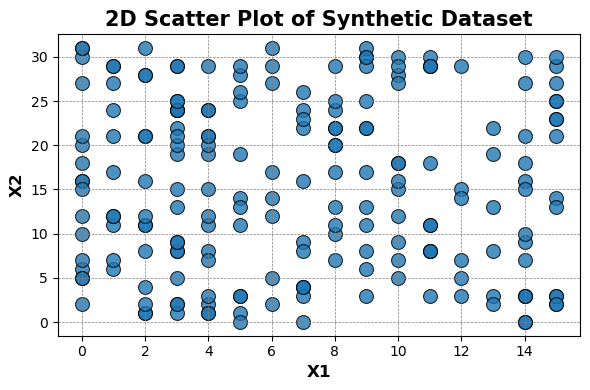

In [1]:
# Creating a synthetic dataset with two discrete attributes

import numpy as np
import pandas as pd
from inference.dataset import Dataset
from inference.domain import Domain
import seaborn as sns
import matplotlib.pyplot as plt


# Set seed for reproducibility
np.random.seed(0)

# Number of data points and domain
n_data_points = 200
domain = {"X1": 16, "X2": 32}

# Generating synthetic data
X1 = np.random.randint(0, domain["X1"], n_data_points)  # Values from 0 to 15
X2 = np.random.randint(0, domain["X2"], n_data_points)  # Values from 0 to 31

# Creating a DataFrame
synthetic_data = pd.DataFrame({'X1': X1, 'X2': X2})
data = Dataset(df=synthetic_data, domain=Domain.fromdict(domain))

# Visualizing the synthetic dataset
plt.figure(figsize=(6, 4), dpi=100)
sns.scatterplot(x='X1', y='X2', data=synthetic_data, s=100, edgecolor='k', alpha=0.8)

plt.title('2D Scatter Plot of Synthetic Dataset', fontsize=15, fontweight='bold')
plt.xlabel('X1', fontsize=12, fontweight='bold')
plt.ylabel('X2', fontsize=12, fontweight='bold')

# Customizing grid and layout for better appearance
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()

plt.show()

$\textbf{Measuring and privatizing marginals.  }$ In this step, we focus on measuring and privatizing the marginals of our dataset. Given that our dataset comprises only two features, X1 and X2, we select the 2-Way marginals, which in this case is the single combination ('X1', 'X2').

In [2]:
from utils_examples import measure_noisy_marginals, visualize_measurements

epsilon = 10.0  # Differential privacy parameter
delta = 1e-5   # Differential privacy parameter
workload = [('X1', 'X2')]  # Workload for two-way marginals

# Measure noisy marginals
measurements = measure_noisy_marginals(data, epsilon, delta, workload)

Once the marginals are measured and noise is added, we visualize the original counts of the marginals and the noisy counts after privatization. This visualization illustrates the effect of noise on the 16x32=512 possible combinations of the attributes. Note that the measurements define corresponding finite signed measures.

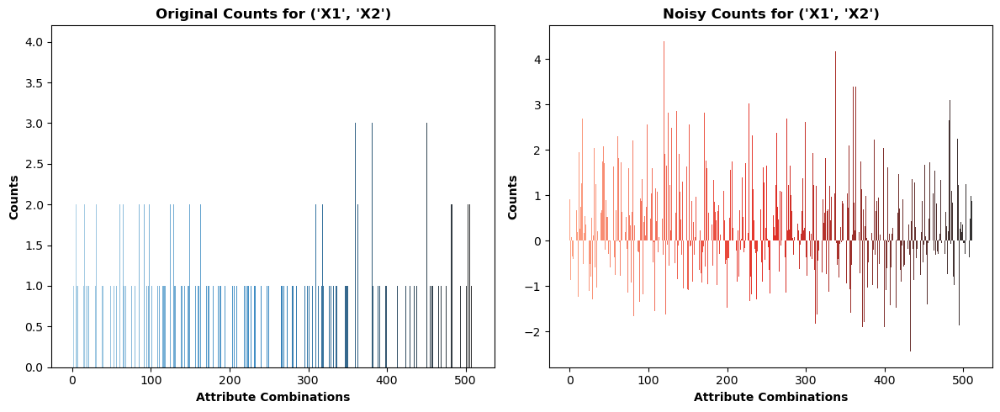

In [3]:
# Visualize the measurements
visualize_measurements(data, measurements)

$\textbf{Generating private dataset with PrivPGD.  }$ Having measured the private marginals, our next objective is to construct the private dataset. This construction is facilitated by the PrivPGD method. Within PrivPGD, the `_setup` function encompasses the projection step, as well as the quantization process. These steps are discussed in Section 3.2 of the paper.

To demonstrate this, the following code initializes the generation engine using `AdvancedSlicedInference` and processes the measurements through the `_setup` function:

In [4]:
from inference.privpgd.inference import AdvancedSlicedInference

generation_engine = AdvancedSlicedInference(
        domain=data.domain,
        hp={"n_particles": 100, "iters": 700, "eval_particles": True},
    )

measurements = generation_engine.fix_measurements(measurements)
generation_engine._setup(measurements, data.df.shape[0])


$\textbf{Examining the output of the projection step.  }$ The key purpose of the projection step is to transform finite signed measures into probability measures. This transformation is crucial for rendering the measures suitable for the Sliced Wasserstein distance, which is minimized in the subsequent optimization step.

By applying this projection, we ensure that the transformed measures define a valid probability distribution over the attribute combinations. 

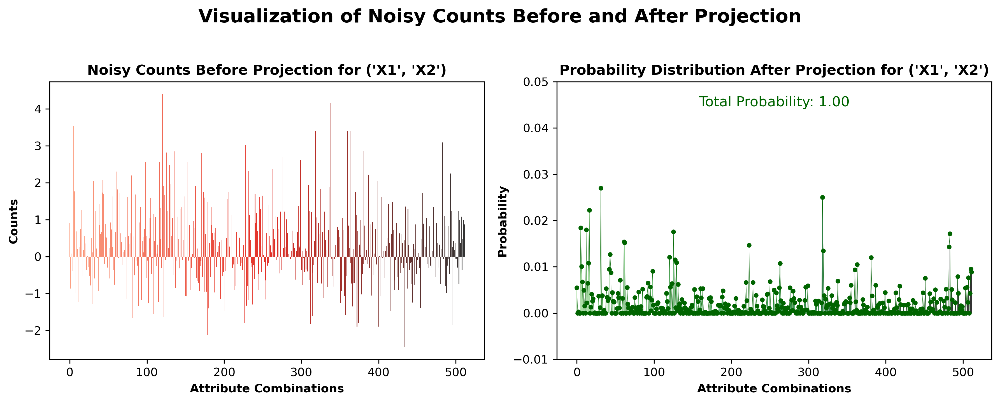

In [8]:
from utils_examples import visualize_projection_comparison

# Assuming the measurements and processed_measurements variables are already defined and populated
processed_measurements = [measurement[0] for measurement in generation_engine.processed_measurements][0]
_, _ = visualize_projection_comparison(measurements, processed_measurements)


$\textbf{Quantization of Probability Measures in the Projection Step.  }$ Following the projection step, the finite probability measures undergo a quantization process. This quantization is performed in an embedding space, which, for our purposes, is chosen to be a hypercube with a fixed grid.

A significant aspect of this quantization step is that we quantize the measure using the same number of particles as the dataset we aim to generate. This approach facilitates efficient execution of the optimization step, where the gradient of the Sliced Wasserstein (SW) distance is computed, as detailed in Section 3.3, "Computing the gradient of the SW distance" of the paper.

Let's visualize the outcome of the quantization step:

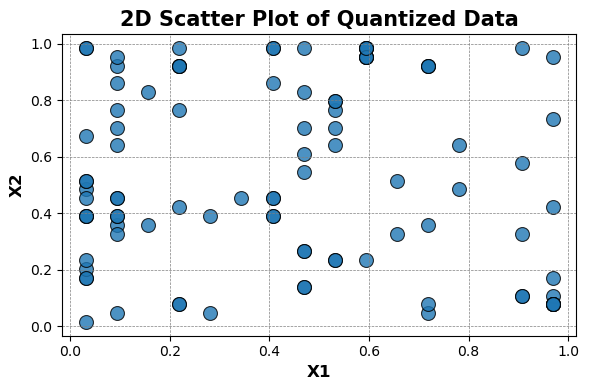

In [9]:
from utils_examples import visualize_quantization

quantized_measurements = generation_engine.quantized_measurements[('X1', 'X2')]
visualize_quantization(quantized_measurements)

$\textbf{Executing the Optimization Step.  }$ The final step is the optimization, as detailed in Section 3.3 of the paper. In this step, we minimize the Sliced Wasserstein distance between the quantized private marginals and a dataset that we initially randomize in the embedding space.

We employ particle gradient descent, observing its evolution over approximately 700 iterations. Remarkably, as the iterations progress, the particles converge precisely, signifying the successful minimization of the distance.

Upon completion of particle gradient descent, we map the dataset from the embedding space back to the original input space. This mapping is the last step before releasing the final dataset.

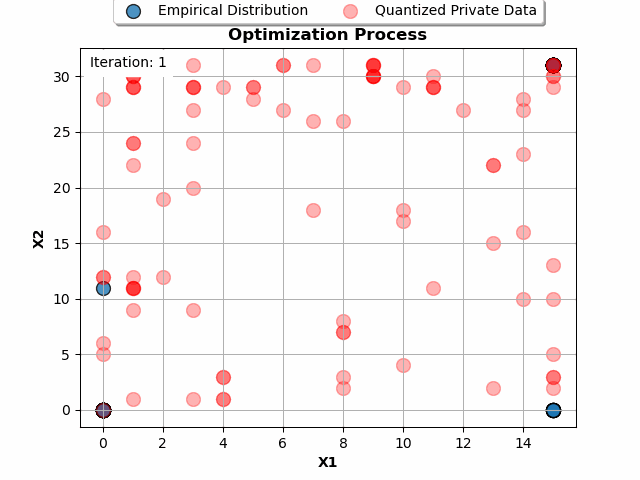

In [17]:
from utils_examples import animate_optimization_to_gif
from IPython.display import Image

generation_engine.particle_gradient_descent()
particle_data = generation_engine.history_particles
quantized_measurements_disc = generation_engine.embedding.discretize(quantized_measurements, generation_engine.domain.attrs)
df_quantized_measurements = pd.DataFrame(quantized_measurements_disc.detach().cpu().numpy(), columns=generation_engine.domain.attrs)
filename = animate_optimization_to_gif(particle_data, np.array(df_quantized_measurements), filename='optimization_animation.gif', fps=40, pause_duration=3)

Image(filename=filename)